**<h1> Pillow Library (PIL)</h1>**

# Objectives
Image processing and computer vision tasks include displaying, cropping, flipping, rotating,  image segmentation, classification, image restoration,  image recognition, image generation.  Also, working with images via the cloud requires storing, transmitting, and gathering images through the internet. 

Python is an excellent choice as it has many image processing tools, computer vision and artificial intelligence libraries. Finally, it has many libraries for working with files in the cloud and on the internet.

A digital image is simply a file in your computer. In this lab, you will gain an understanding of these files and learn to work with these files with the Pillow Library (PIL).

<ul>
    <li><a href='#PIL'>Python Image Libraries </a>
        <ul>
            <li>Image Files and Paths  </li>
            <li>Load in Image in Python</li>
            <li>Plotting an Image </li>
            <li>Gray Scale Images, Quantization and Color Channels  </li>
            <li> PIL Images into NumPy Arrays  </li>
        </ul>
    </li>
    
</ul>

In [1]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png -O lenna.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png -O baboon.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/barbara.png -O barbara.png 

--2024-01-31 13:51:44--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)... 169.63.118.104
Connecting to cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)|169.63.118.104|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 473831 (463K) [image/png]
Saving to: ‘lenna.png’

lenna.png           100%[===================>] 462.73K   212KB/s    in 2.2s    

2024-01-31 13:51:49 (212 KB/s) - ‘lenna.png’ saved [473831/473831]

--2024-01-31 13:51:49--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-course

In [2]:
# First, let's define a helper function to concatenate two images side-by-side
def get_concat_h(im1, im2):
    #https://note.nkmk.me/en/python-pillow-concat-images/
    dst = Image.new('RGB', (im1.width + im2.width, im1.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (im1.width, 0))
    return dst

In [3]:
# Below, we define my_image as the filename of a file in this directory.
my_image = "lenna.png"

In [4]:
# get the current path of the current working directory 
# The os module provides functions to interact with the file system, 
#e.g. creating or removing a directory (folder), listing its contents, changing and identifying the current working directory.
import os
cwd = os.getcwd()
cwd 

'/Users/omaraffifi/Downloads/Untitled Folder'

In [5]:
# path to the image
image_path = os.path.join(cwd, my_image)
image_path

'/Users/omaraffifi/Downloads/Untitled Folder/lenna.png'

### Load the image to python

Pillow (PIL) library is a popular library for loading images in Python. In addition, many other libraries such as "Keras" and "PyTorch" use this library to work with images. The Image module provides functions to load images from and saving images to the file system. Let's import it from PIL.

In [8]:
# install pillow which is the new name for PIL
!pip install pillow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 2.5 MB/s eta 0:00:0000:0100:010m


In [11]:
# The Image module provides functions to load images from and saving images to the file system
from PIL import Image

In [12]:
# check the type of the image
image = Image.open(my_image)
type(image)

PIL.PngImagePlugin.PngImageFile

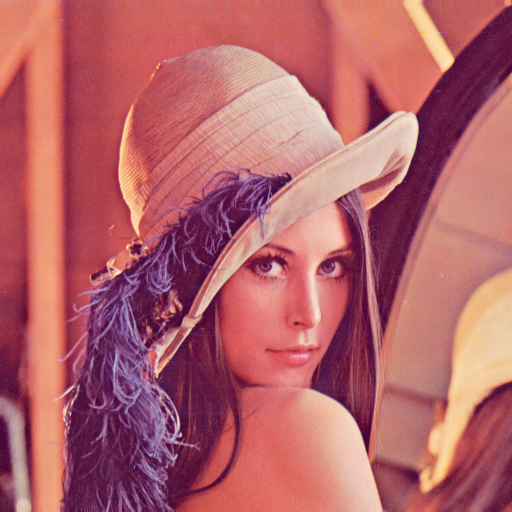

In [13]:
# view the image
image

### Plotting an image
We can also use the method `show` of PIL objects to display the image. Please note this method may or may not work depending on your setup.

In [15]:
!pip install matplotlib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 157.6/157.6 kB 560.7 kB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.1/115.1 kB 2.7 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.5/7.5 MB 4.1 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.4/243.4 kB 3.8 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 4.8 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.2/66.2 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.0/14.0 MB 3.5 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 103.1/103.1 kB 4.1 MB/s eta 0:00:00


In [16]:
import matplotlib.pyplot as plt

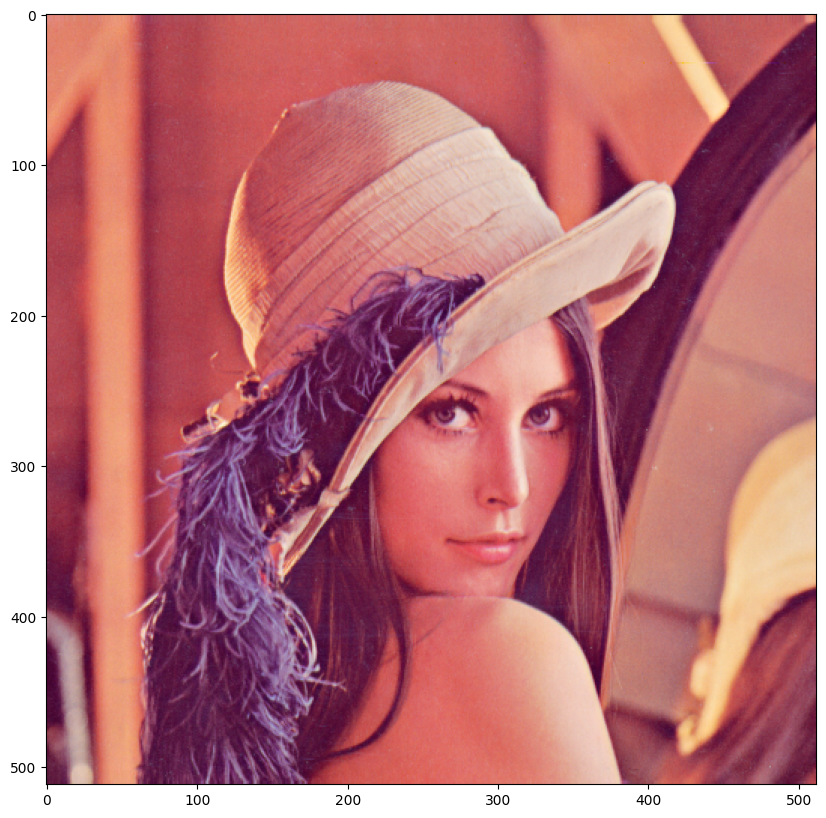

In [17]:
# display the picture using matplotlib
plt.figure(figsize = (10,10))
plt.imshow(image)
plt.show()

In [18]:
# check the size of the image
image.size

(512, 512)

In [20]:
# check the pixel format of the image
image.mode

'RGB'

In [21]:
# The load method of PIL object reads the file content, decodes it, and expands the image into memory.
im = image.load()

In [22]:
# now you can check the intensity of the image using any x and y 2D coordinate values
x = 2
y = 4
im[y,x]

(226, 138, 120)

In [23]:
# you can save the image as JPG
image.save('lenna.jpg')

### GrayScale Images

The ImageOps module contains several ‘ready-made’ image processing operations. This module is somewhat experimental, and most operators only work with grayscale and/or RGB images.

In [24]:
from PIL import ImageOps

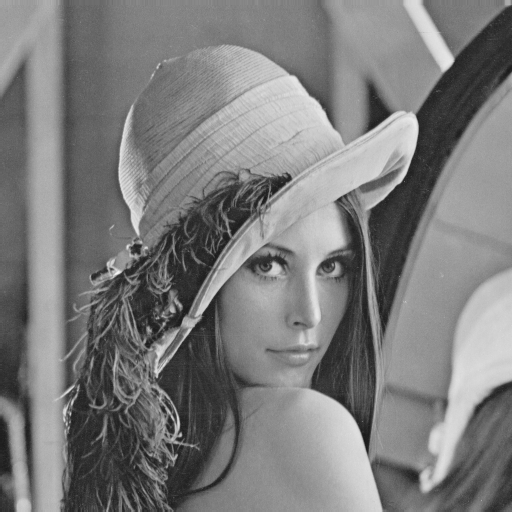

In [25]:
# make the image gray
image_gray = ImageOps.grayscale(image)
image_gray

In [26]:
# mode of the image
image_gray.mode

'L'

### Quantization

The Quantization of an image is the number of unique intensity values any given pixel of the image can take. For a grayscale image, this means the number of different shades of gray. Most images have 256 different levels. You can decrease the levels using the method quantize. Let's repeatably cut the number of levels in half and observe what happens:

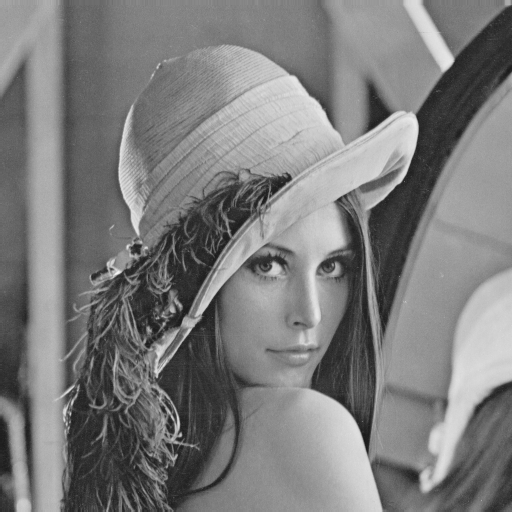

In [28]:
image_gray.quantize(256 // 2)
image_gray

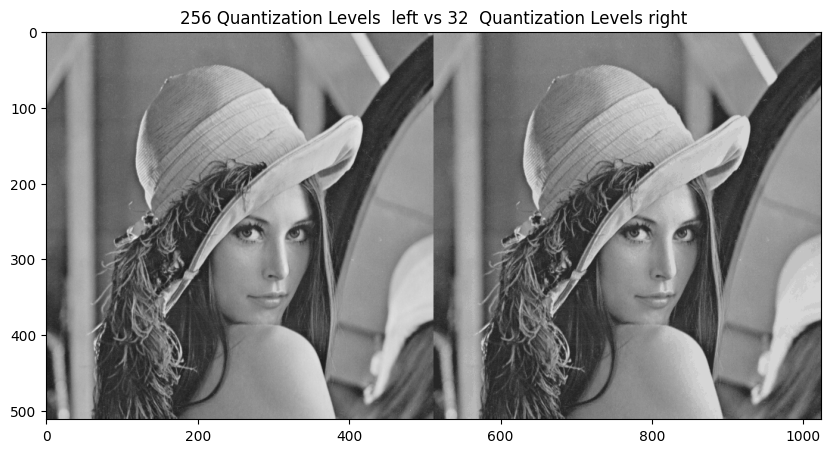

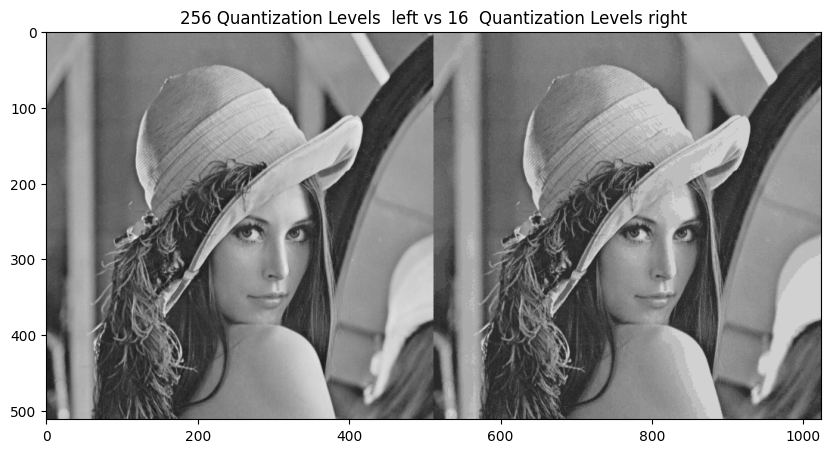

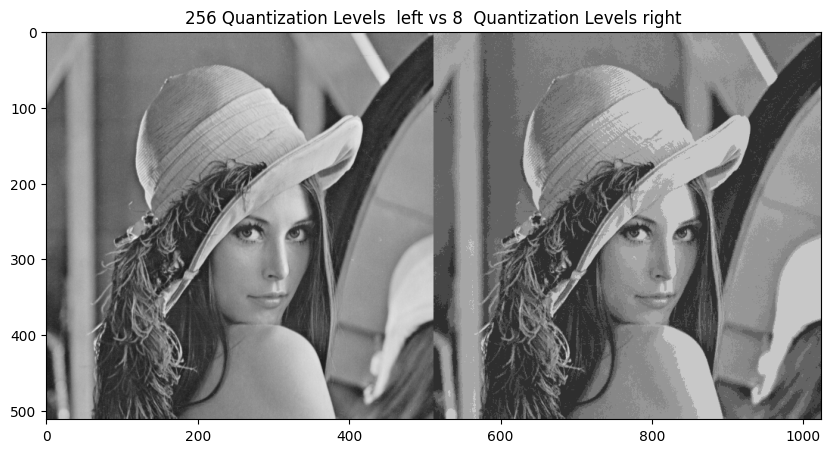

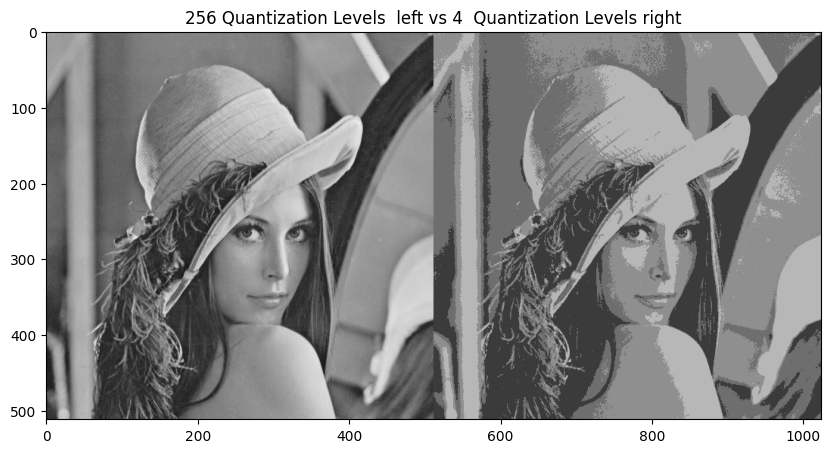

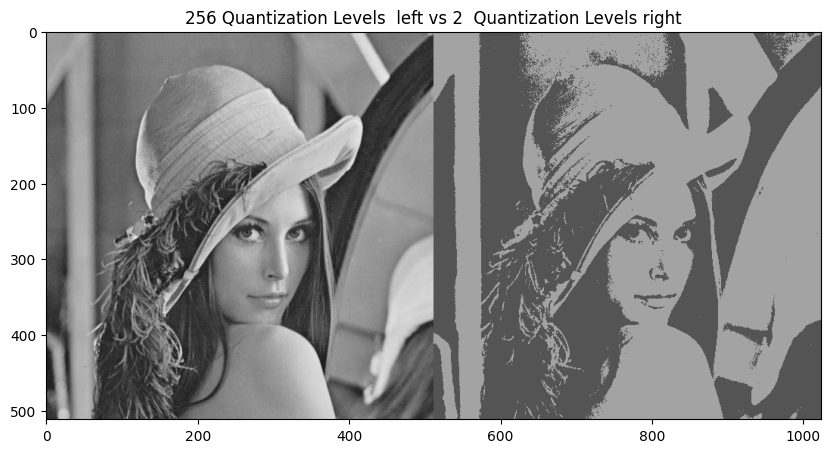

In [29]:
# see when you keep decreasing the quantization value, how the image changes
#get_concat_h(image_gray,  image_gray.quantize(256//2)).show(title="Lena") 
for n in range(3,8):
    plt.figure(figsize=(10,10))

    plt.imshow(get_concat_h(image_gray,  image_gray.quantize(256//2**n))) 
    plt.title("256 Quantization Levels  left vs {}  Quantization Levels right".format(256//2**n))
    plt.show()

### Color Channeling

Makes you work with different colors

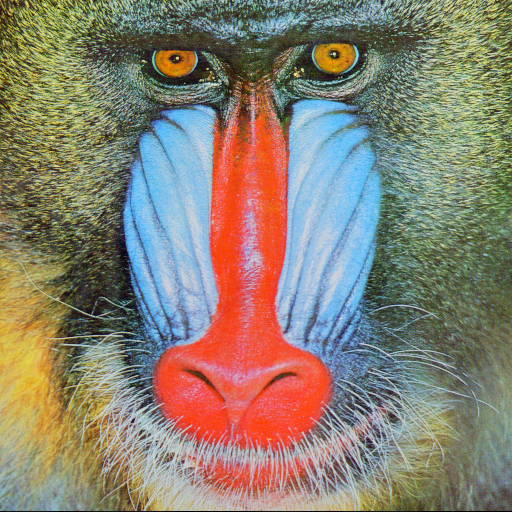

In [30]:
baboon = Image.open('baboon.png')
baboon

In [31]:
# Split the RGB to its distinct colors
red, green, blue = baboon.split()

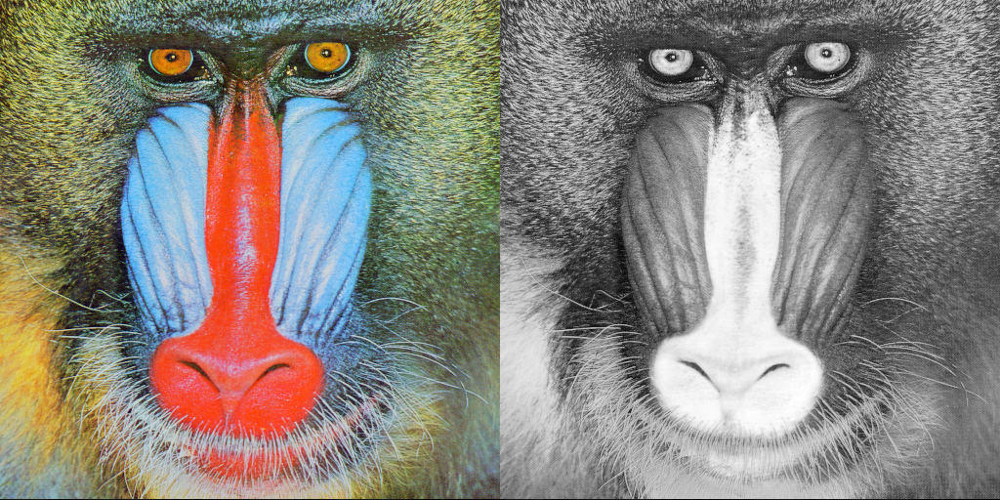

In [32]:
# differentiates the red from the rest of the colors, same could be done for green and blue
get_concat_h(baboon, red)

### PIL Images into NUMPY Arrays

We can convert a PIL image to a NumPy array. We use asarray() or array function from NumPy to convert PIL images into NumPy arrays.

In [33]:
import numpy as np

In [34]:
# convert to a numpy array
array = np.asarray(image)
print(type(array))

<class 'numpy.ndarray'>


In [35]:
# summarize shape
print(array.shape)

(512, 512, 3)


The attribute shape of a numpy.array object returns a tuple corresponding to the dimensions of it, the first element gives the number of rows or height of the image, the second is element is the number of columns or width of the image. The final element is the number of colour channels.

In [36]:
# prints the array for the three distinct colors
print(array)

[[[226 137 125]
  [226 137 125]
  [223 137 133]
  ...
  [230 148 122]
  [221 130 110]
  [200  99  90]]

 [[226 137 125]
  [226 137 125]
  [223 137 133]
  ...
  [230 148 122]
  [221 130 110]
  [200  99  90]]

 [[226 137 125]
  [226 137 125]
  [223 137 133]
  ...
  [230 148 122]
  [221 130 110]
  [200  99  90]]

 ...

 [[ 84  18  60]
  [ 84  18  60]
  [ 92  27  58]
  ...
  [173  73  84]
  [172  68  76]
  [177  62  79]]

 [[ 82  22  57]
  [ 82  22  57]
  [ 96  32  62]
  ...
  [179  70  79]
  [181  71  81]
  [185  74  81]]

 [[ 82  22  57]
  [ 82  22  57]
  [ 96  32  62]
  ...
  [179  70  79]
  [181  71  81]
  [185  74  81]]]


In [37]:
# We can find the maximum and minimum intensity value of the array:      
print(array.min())
print(array.max())

3
255


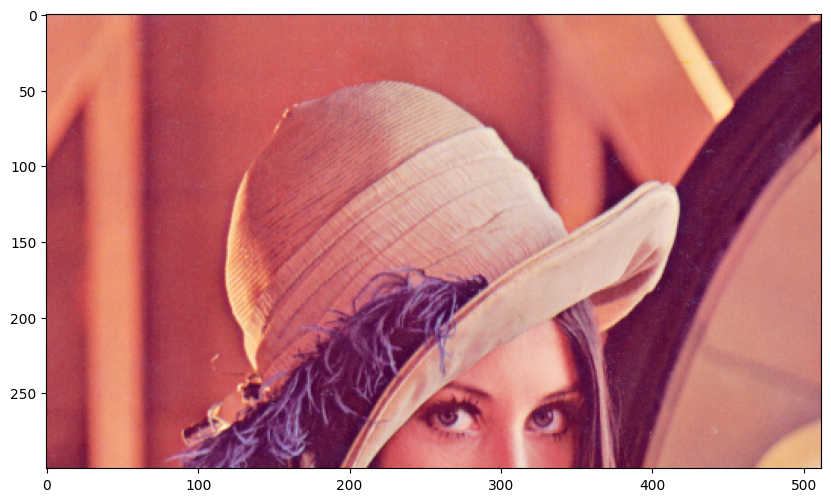

In [38]:
# you can slice the image by choosing the array of either the columns or rows
plt.figure(figsize=(10,10))
plt.imshow(array[0:300,:,:])
plt.show()

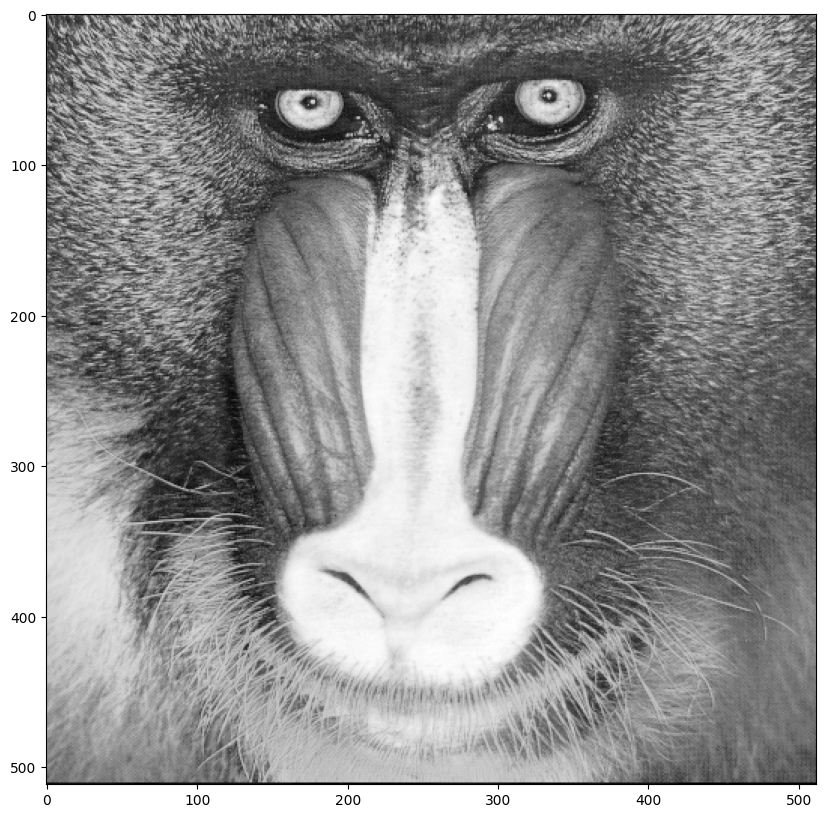

In [39]:
# plot the red channel as intensity values of the red channel
baboon_array = np.array(baboon)
plt.figure(figsize=(10,10))
plt.imshow(baboon_array[:,:,0], cmap='gray')
plt.show()

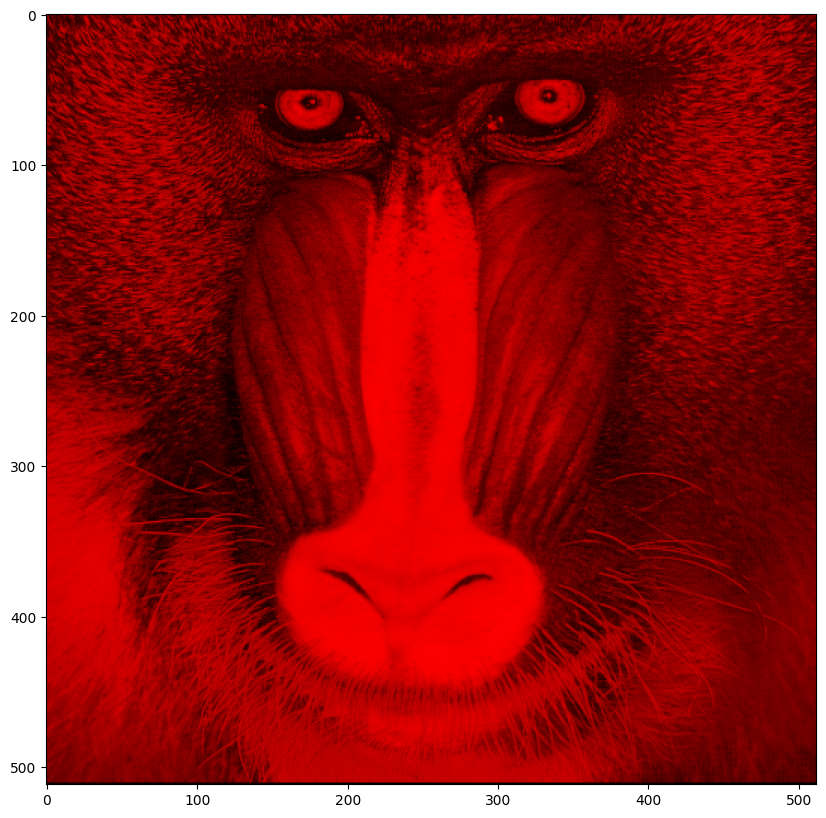

In [40]:
# or you could create a new array and set all the other colors other than red to zero
baboon_red=baboon_array.copy()
baboon_red[:,:,1] = 0
baboon_red[:,:,2] = 0
plt.figure(figsize=(10,10))
plt.imshow(baboon_red)
plt.show()

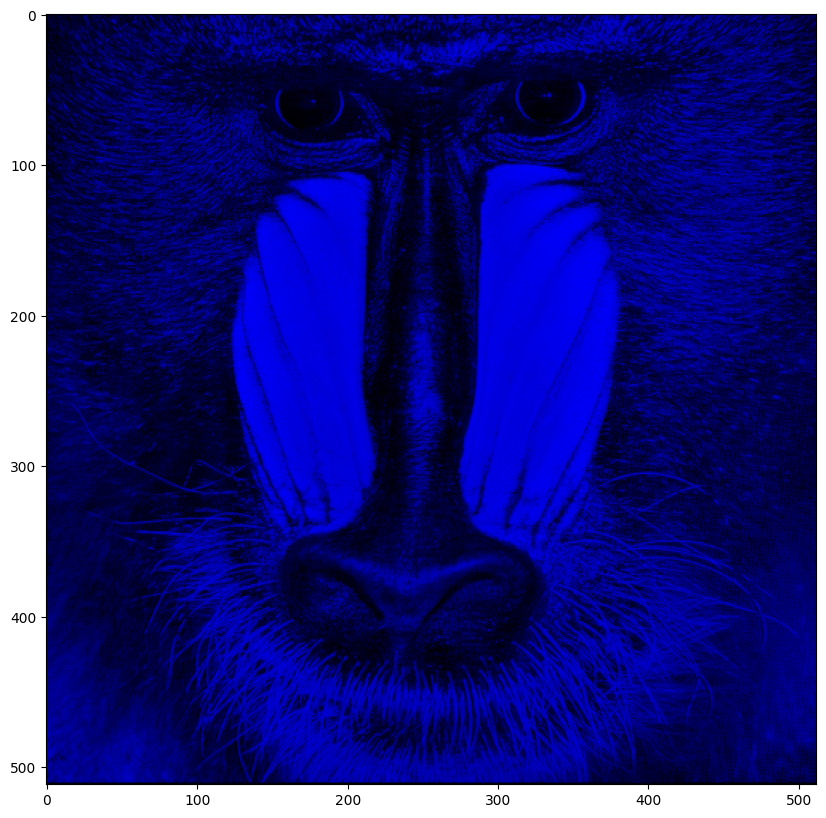

In [41]:
# samer for blue
baboon_blue=baboon_array.copy()
baboon_blue[:,:,0] = 0
baboon_blue[:,:,1] = 0
plt.figure(figsize=(10,10))
plt.imshow(baboon_blue)
plt.show()